# THE BRIDGE (Data Science Bootcamp - Agosto 2020)
##  PROYECTO GRUPO D 
________________
### Análisis de datos asociados al COVID-19 del grupo de paises conformado por Portugal, Venezuela, Turquía, Reino Unido y España.

Fuente de datos (Data Set)  [https://covid.ourworldindata.org/data/owid-covid-data.csv]

Team members: 
- ** José Luis Manjon **     presimanjon@yahoo.es        git @JoseLuisManjon
- ** Filipa Teles      **    filipa.teles@icloud.com     git @Filipate
- ** Mónica Villasuso  **    villasuso.monica@gmail.com  git @MVillasuso
_________________

## 1. Librerías requeridas para el análisis (* Import *)
_________

In [1]:
import sys 
sys.path.append('../src/utils') 
import pandas as pd  
import numpy as np
from datetime import datetime
from datetime import date
from datetime import timedelta
import folders_tb as ftb
import visualization_tb as vtb
import mining_data_tb as mtb

IndentationError: unexpected indent (mining_data_tb.py, line 55)

## 2. Carga de datos inicial, de la fuente, en el dataframe        
## *covid_general*
____________

In [2]:
url = "https://covid.ourworldindata.org/data/owid-covid-data.csv"
covid_general = pd.read_csv(url, sep=",")

## 3. Preparación de los datos - Data wrangling and Data cleaning
________________
Exploración de los datos del dataframe

In [3]:
covid_general.shape

(37839, 40)

In [4]:
covid_general.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37628 entries, 0 to 37627
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         37557 non-null  object 
 1   continent                        37326 non-null  object 
 2   location                         37628 non-null  object 
 3   date                             37628 non-null  object 
 4   total_cases                      37051 non-null  float64
 5   new_cases                        37051 non-null  float64
 6   new_cases_smoothed               36269 non-null  float64
 7   total_deaths                     37051 non-null  float64
 8   new_deaths                       37051 non-null  float64
 9   new_deaths_smoothed              36269 non-null  float64
 10  total_cases_per_million          36987 non-null  float64
 11  new_cases_per_million            36987 non-null  float64
 12  new_cases_smoothed

In [5]:
covid_general.index

RangeIndex(start=0, stop=37628, step=1)

In [6]:
# Revisión de los datos globales para ver si hay información totalizada (continent or country tienen valor  Null) y eliminarla posteriormente para el análisis
covid_general[(covid_general.continent.isnull()) | (covid_general.iso_code.isnull())]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
37326,OWID_WRL,NaN,World,2019-12-31,27.0,27.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37327,OWID_WRL,NaN,World,2020-01-01,27.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37328,OWID_WRL,NaN,World,2020-01-02,27.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37329,OWID_WRL,NaN,World,2020-01-03,44.0,17.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37330,OWID_WRL,NaN,World,2020-01-04,44.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37623,NaN,NaN,International,2020-03-06,NaN,NaN,0.000,NaN,NaN,0.286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37624,NaN,NaN,International,2020-03-07,NaN,NaN,0.000,NaN,NaN,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37625,NaN,NaN,International,2020-03-08,NaN,NaN,0.000,NaN,NaN,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37626,NaN,NaN,International,2020-03-09,NaN,NaN,0.000,NaN,NaN,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Dataframe mundial sin los datos globales (continent) o de países con valor Nan  
### * world_df * 
____________

In [7]:
world_df = mtb.world (covid_general)

In [8]:
world_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37326 entries, 0 to 37325
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   iso_code                         37326 non-null  object        
 1   continent                        37326 non-null  object        
 2   location                         37326 non-null  object        
 3   date                             37326 non-null  datetime64[ns]
 4   total_cases                      36756 non-null  float64       
 5   new_cases                        36756 non-null  float64       
 6   new_cases_smoothed               35979 non-null  float64       
 7   total_deaths                     36756 non-null  float64       
 8   new_deaths                       36756 non-null  float64       
 9   new_deaths_smoothed              35979 non-null  float64       
 10  total_cases_per_million          36756 non-null  float64  


### Ranking con respecto al total de países
What position do your countries occupe respect to the number of total infected, total deaths and total recoveries?
______________

In [9]:
world_df = mtb.crear_rank(world_df)

### ANÁLISIS CONJUNTO PAISES DEL GRUPO D
### PORTUGAL, VENEZUELA, TURQUÍA, GRAN BRETAÑA y ESPAÑA
________________

### Dataframe de los datos correspondientes a los países del grupo D
### * covid_grupoD *

In [10]:
paises_grupoD=["PRT", "VEN", "TUR", "GBR", "ESP"]
paises_nombres={"PRT":"Portugal", "VEN":"Venezuela", "TUR":"Turquía", "GBR":"Gran Bretaña", "ESP":"España"}

In [11]:
covid_grupoD = mtb.crear_df_grupo (world_df, paises_grupoD)

In [12]:
#Selección de los registros a partir de la fecha en que comenzaron a reportar  datos de COVID
covid_grupoD[covid_grupoD["date"] == covid_grupoD["date"].min()]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
10750,ESP,Europe,Spain,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0,NaN
12489,GBR,Europe,United Kingdom,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,20.0,24.7,NaN,2.54,81.32,2.0,1.0,2.0,1.0,NaN


 *NOTA: A pesar de que tanto España como el Reino Unido tienen registros desde el 31/12/2019, estos No contienen información relacionada al Covid 19*

In [13]:
covid_grupoD.new_cases.value_counts(dropna = False).sum()

944

In [14]:
# Verificar si hay alguna columna donde TODOS sus datos sean nulos y por lo tanto no aporte información al análisis
covid_grupoD.isnull().sum()

iso_code                             0
continent                            0
location                             0
date                                 0
total_cases                          3
new_cases                            3
new_cases_smoothed                  30
total_deaths                         3
new_deaths                           3
new_deaths_smoothed                 30
total_cases_per_million              3
new_cases_per_million                3
new_cases_smoothed_per_million      30
total_deaths_per_million             3
new_deaths_per_million               3
new_deaths_smoothed_per_million     30
new_tests                          515
total_tests                        485
total_tests_per_thousand           485
new_tests_per_thousand             515
new_tests_smoothed                 401
new_tests_smoothed_per_thousand    401
tests_per_case                     403
positive_rate                      403
tests_units                        373
stringency_index         

In [ ]:
if len (df[df["date"] == df["date"].max()].index)< len (paises):
    df.drop(df[df["date"] == df["date"].max()].index, axis =0, inplace = True)

In [15]:
# Validación de la fecha mínima y máxima en que cada pais del grupo reporta información de Covid19
covid_grupoD.groupby("iso_code")["date"].agg(["min","max"])

,min,max
iso_code,,
ESP,2019-12-31,2020-08-16
GBR,2019-12-31,2020-08-17
PRT,2020-03-01,2020-08-17
TUR,2020-03-12,2020-08-17
VEN,2020-03-15,2020-08-17


In [16]:
# limpiar el DF covid_grupoD eliminando las filas que NO contienen info del COVID y  las columnas que no aportan información 
covid_grupoD = mtb.limpiar_grupo(covid_grupoD,"handwashing_facilities")

In [17]:
covid_grupoD.shape

(944, 45)

---
pruebas de JL para obtener un covid_grupoD que haga que salgan bien los gráficos pie

In [18]:
covid_grupoD[covid_grupoD["date"] == '2020-08-16']

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
229,10979,ESP,Europe,Spain,2020-08-16,342813.0,0.0,4064.429,28617.0,0.0,...,7.17,27.4,31.4,2.97,83.56,10.0,8.0,30.0,5.0,8.35
459,12718,GBR,Europe,United Kingdom,2020-08-16,317444.0,1077.0,1097.286,41361.0,4.0,...,4.28,20.0,24.7,2.54,81.32,12.0,5.0,53.0,6.0,13.03
629,28385,PRT,Europe,Portugal,2020-08-16,53981.0,198.0,206.286,1775.0,3.0,...,9.85,16.3,30.0,3.39,82.05,47.0,36.0,49.0,35.0,3.29
786,34315,TUR,Asia,Turkey,2020-08-16,248117.0,1256.0,1213.571,5955.0,21.0,...,12.13,14.1,41.1,2.81,77.69,18.0,22.0,80.0,63.0,2.40
942,36020,VEN,South America,Venezuela,2020-08-16,32607.0,1226.0,1205.857,276.0,10.0,...,6.47,NaN,NaN,0.80,72.06,60.0,76.0,110.0,132.0,0.85


In [19]:
from datetime import date
from datetime import timedelta
hoy = date.today()
print(hoy)
day_pie = str(date.today() - timedelta(days=1))
covid_grupoD[covid_grupoD["date"] <=day_pie]

2020-08-18


'2020-08-17'

In [20]:
covid_grupoD[covid_grupoD["date"] <=day_pie]

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
460,12719,GBR,Europe,United Kingdom,2020-08-17,318484.0,1040.0,1094.143,41366.0,5.0,...,4.28,20.0,24.7,2.54,81.32,11.0,5.0,52.0,5.0,12.99
630,28386,PRT,Europe,Portugal,2020-08-17,54102.0,121.0,204.857,1778.0,3.0,...,9.85,16.3,30.0,3.39,82.05,46.0,35.0,48.0,34.0,3.29
787,34316,TUR,Asia,Turkey,2020-08-17,249309.0,1192.0,1215.000,5974.0,19.0,...,12.13,14.1,41.1,2.81,77.69,17.0,21.0,79.0,62.0,2.40
943,36021,VEN,South America,Venezuela,2020-08-17,33755.0,1148.0,1135.714,281.0,5.0,...,6.47,NaN,NaN,0.80,72.06,58.0,76.0,108.0,131.0,0.83


----
Fin de las pruebas

-----

### Período de estado de alarma por país del grupo D y carga en un dataframe
(Fuentes:
- España, Gran Bretaña y Portugal
 https://www.cidob.org/biografias_lideres_politicos/organismos/union_europea/covid_19_la_respuesta_de_europa_contra_la_pandemia)

- Venezuela
 https://cronica.uno/publicado-en-gaceta-oficial-decreto-que-extiende-hasta-junio-estado-de-alarma-por-covid-19/
- Turquía
 https://elpais.com/sociedad/2020-04-10/el-aumento-de-casos-de-coronavirus-empuja-al-gobierno-turco-a-declarar-un-toque-de-queda-durante-el-fin-de-semana.html
 
*NOTA: En Turquía no se ha decretado oficialmente el estado de alarme, pero se han tomado medidas de contención con el objetivo de contener la propagación del virus* 

### * alarm_dates * 

In [21]:
alarm_dicc = {'iso_code': paises_grupoD,
        'alarm_init': ['2020-03-13', '2020-03-13',np.NaN,'2020-03-23','2020-03-14'],
        'alarm_end': ['2020-06-01', '2020-07-11', np.NaN, '2020-07-04','2020-06-21']
       }
alarm_dates = pd.DataFrame(alarm_dicc, columns = ['iso_code', 'alarm_init', 'alarm_end'])

alarm_dates

,iso_code,alarm_init,alarm_end
0,PRT,2020-03-13,2020-06-01
1,VEN,2020-03-13,2020-07-11
2,TUR,NaN,NaN
3,GBR,2020-03-23,2020-07-04
4,ESP,2020-03-14,2020-06-21


## 4. Análisis de tendencias en los datos (EDA)
________________

In [22]:
#Lista de las columnas de datos para graficarlas y contrastar la tendencia entre los países del grupo D
cols = list(covid_grupoD.columns.values[[5,6,7,8,9,10,11,12,13,14,15,16,17,18,36,37,38,39]])

_________
### 4.1 ANÁLISIS GLOBAL GRUPO D : Visualización de los 5 países en una gráfica por cada columna de datos
_________

### PIE CHARTS

In [23]:
vtb.grafI_pie(world_df, "total_cases", 300000)

In [24]:
vtb.grafI_pie(world_df, "total_deaths", 15000)

In [25]:
vtb.grafI_pieD_O(world_df,"total_cases", paises_grupoD)

In [26]:
vtb.grafI_pieD_O(world_df,"total_deaths", paises_grupoD)

In [27]:
vtb.grafI_pieD(covid_grupoD, "total_cases")

In [28]:
vtb.grafI_pieD(covid_grupoD, "total_deaths")

### RANKING

In [29]:
# Posición de los países del grupo D en el ranking mundial 
vtb.graf_rank_D(covid_grupoD)

### OUTLIERS ANALYSIS

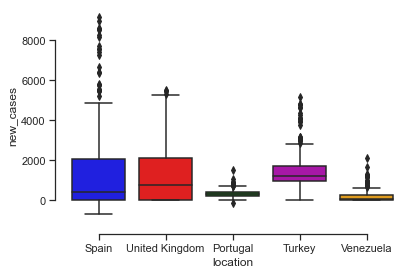

In [30]:
# Boxplot para mostrar casos diarios por pais
vtb.graf_outlD(covid_grupoD,"new_cases")


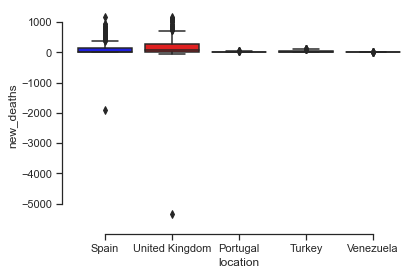

In [31]:
# Boxplot para mostrar muertes diarias por pais
vtb.graf_outlD(covid_grupoD,"new_deaths")


### TENDENCIAS

In [32]:
for elem in cols:
    vtb.grafI_grupo("date" , elem , "iso_code", covid_grupoD, False )

______________
### 4.2 ANÁLISIS INDIVIDUAL POR PAÍS GRUPO D
Show different tendencies for each column in your dataset. Show, vertically, the start date and end date of the alarm state in each plot
______________

### GRÁFICOS POR PAÍS CON REFERENCIA A LAS FECHAS DE ESTADO DE ALARMA
- CASOS TOTALES y MUERTES TOTALES
- RANKING (EVOLUCIÓN DE LA POSICIÓN DESDE EL INICIO DE LA PANDEMIA)
- CASOS DIARIOS Y MUERTES DIARIAS
- MUERTES DIARIAS y MOMENTO EN QUE LA CURVA CRECE Y DECRECE

__________________

In [33]:
col_dat1 = ["total_cases", "total_deaths", "total_cases_per_million"]
col_dat2 = [ "rank_TC", "rank_TD", "rank_TCxM", "rank_TDxM"]
for elem in paises_grupoD:
    df = covid_grupoD[covid_grupoD.iso_code==elem]
    vtb.grafI_pais(elem, col_dat1, paises_nombres[elem], df, True,alarm_dates)
    vtb.grafI_pais(elem, col_dat2, paises_nombres[elem], df, False, alarm_dates) 
    vtb.graf_daily ('New daily cases',"new_cases", 'Daily deaths', "new_deaths", elem ,df, paises_nombres[elem],alarm_dates )
    vtb.graf_dailyd ('Daily deaths', "new_deaths", elem ,df, paises_nombres[elem])



In [34]:
#Dataframe con información resumida de datos referenciales por país
datos_paises = covid_grupoD.iloc[:,[1,23,24,29,30,32,33]].drop_duplicates()

In [35]:
datos_paises

,iso_code,tests_per_case,positive_rate,median_age,aged_65_older,gdp_per_capita,extreme_poverty
0,ESP,NaN,NaN,45.5,19.436,34272.360,1.0
111,ESP,3.592,0.278,45.5,19.436,34272.360,1.0
112,ESP,3.621,0.276,45.5,19.436,34272.360,1.0
113,ESP,4.040,0.248,45.5,19.436,34272.360,1.0
114,ESP,4.251,0.235,45.5,19.436,34272.360,1.0
...,...,...,...,...,...,...,...
783,TUR,53.149,0.019,31.6,8.153,25129.341,0.2
784,TUR,53.762,0.019,31.6,8.153,25129.341,0.2
785,TUR,54.324,0.018,31.6,8.153,25129.341,0.2
786,TUR,54.317,0.018,31.6,8.153,25129.341,0.2


### VARIACIÓN DEL STRINGENCY INDEX POR PAÍS
*Stringency Index: The Government Response Stringency Index is a composite measure based on nine response indicators including school closures, workplace closures, and travel bans, rescaled to a value from 0 to 100 (100 = strictest response).*

In [36]:
StrIdx_country = covid_grupoD.loc[:,["date","iso_code",  "stringency_index"]]

In [37]:
#Construcción del DF con Stringency Index medio mensual por país
StrIdx_country = covid_grupoD.loc[:,["date","iso_code",  "stringency_index"]]
sig = mtb.crear_sidx_df (StrIdx_country)

In [38]:
vtb.grafI_bar(sig,xval = "date",yval = "stringency_index" , col= "iso_code", mod= "group", tit= "Stringency Index per country  (Monthly mean) - Group D")

###   ANÁLISIS POR CONTINENTE

In [39]:
world_df.continent.value_counts()

Europe           10131
Asia              9236
Africa            8547
North America     5777
South America     2228
Oceania           1407
Name: continent, dtype: int64

In [40]:
vtb.grafI_area(world_df, "date", "total_deaths","continent","iso_code")

In [41]:
vtb.grafI_area(world_df, "date", "new_deaths","continent","iso_code")

In [42]:
vtb.grafI_area(world_df, "date", "total_cases","continent","iso_code")

In [43]:
vtb.grafI_area(world_df, "date", "new_cases","continent","iso_code")

### ÍNDICE DE MORTALIDAD POR PAÍS - GRUPO D
*Según la tasa de mortalidad  calculada como expresión porcentual de total de muertes / total de casos*

In [44]:
vtb.grafI_line(covid_grupoD,xval="date", yval="mortality_rate", col="location" )

### MUERTES TOTALES EN EL MUNDO (MAPA)

In [45]:
world_df_map = (world_df.groupby('location')['total_cases'].max()).to_frame()
world_df_map['index'] = world_df_map.index
world_df_map.rename(columns={'index': 'country'}, inplace=True)

In [46]:
world_df_map_td = (world_df.groupby('location')['total_deaths'].max()).to_frame()
world_df_map_td['index'] = world_df_map_td.index
world_df_map_td.rename(columns={'index': 'country'}, inplace=True)

In [47]:
vtb.grafI_mm(world_df_map,world_df_map,"total_cases", "country names", "country", "darkmint")

In [48]:
vtb.grafI_mm(world_df_map_td,world_df_map,"total_deaths", "country names", "country", "peach")

_________
### 4.3 PROGRESSION 
______________
How is the progression going each ten days (of the daily infected rate)?

In [49]:
covid_grupoD_date_indice=(covid_grupoD.set_index('date')).groupby(['date','location'])['new_cases','new_deaths'].sum()
covid_grupoD_10days = covid_grupoD_date_indice.resample('10D', level=0).sum().reset_index()

In [50]:
vtb.grafI_prog(covid_grupoD_10days, xval= "date", yval = "new_cases",tit = "Group D - 10 days Progression (Daily infected cases)",t="gD")

In [51]:
vtb.grafI_prog(covid_grupoD_10days, xval= "date", yval = "new_deaths",tit = "Group D - 10 days Progression (Daily Deaths)",t="gD")

In [52]:
world_df_date_indice=(world_df.set_index('date')).groupby(['date','location'])['new_cases','new_deaths'].sum()
world_df_10days = world_df_date_indice.resample('10D', level=0).sum().reset_index()

In [53]:
vtb.grafI_prog(world_df_10days, xval= "date", yval = "new_cases",tit = "World - 10 days Progression (Daily infected Cases)",t="W")

In [54]:
vtb.grafI_prog(world_df_10days, xval= "date", yval = "new_deaths",tit = "World - 10 days Progression (Daily deaths)",t="W")

_________
### 4.4 ANÁLISIS DE CORRELACIÓN
______________

### Correlación Países del Grupo D

In [55]:
#Matriz de correlación entre variables
grupoD_corr = covid_grupoD.iloc[:,np.r_[1,5,7,9,11,22:36]]     #Un subconjunto de las variables a contrastar

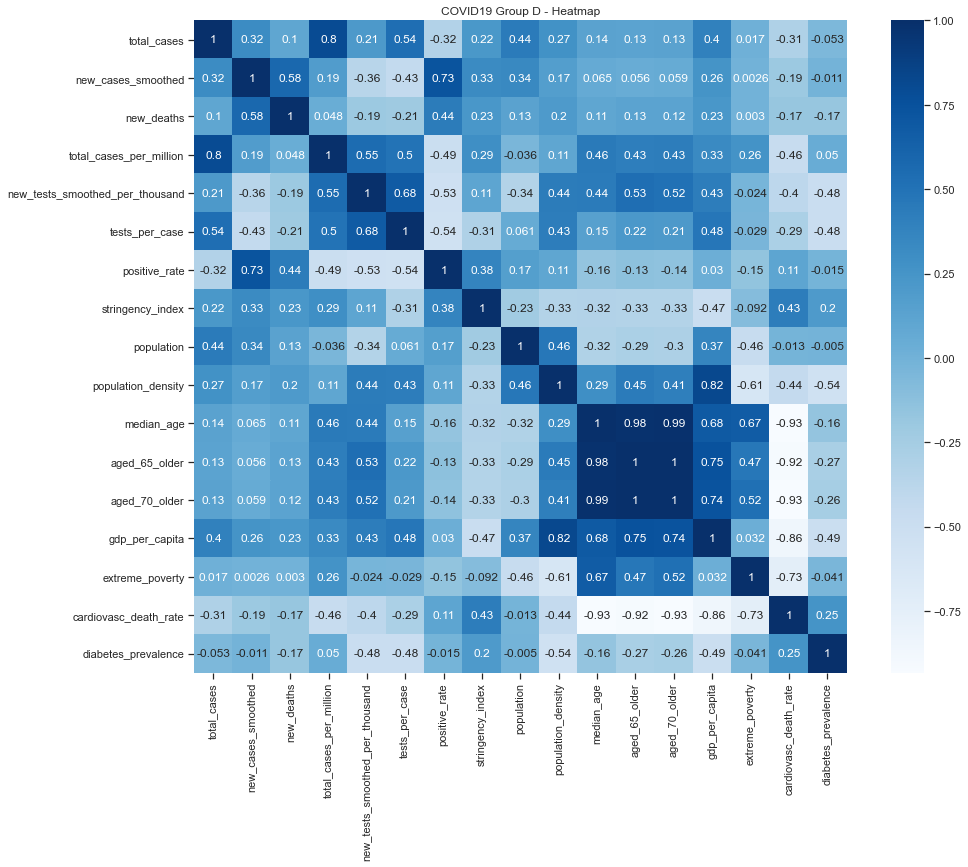

In [56]:
vtb.graf_corr (grupoD_corr, "Blues","gD")

### Correlación - Todos los paises

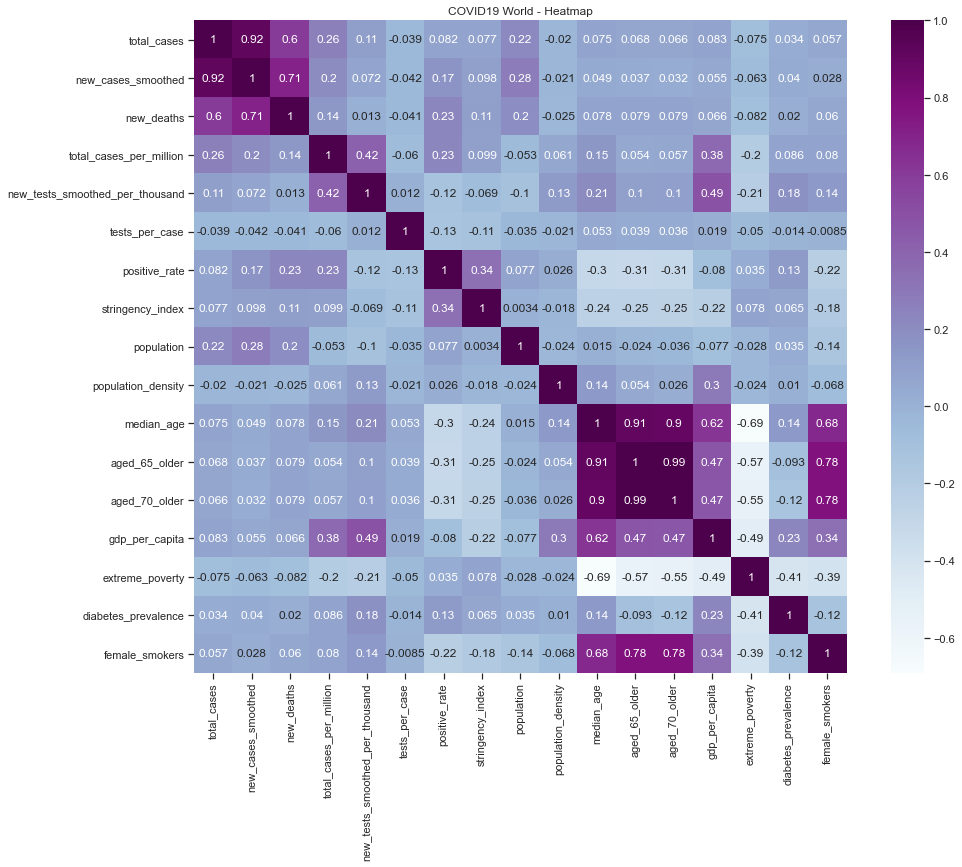

In [57]:
#Seleccion del DF mundial del subconjunto de las variables a correlacionar
world_df_corr = world_df.iloc[:,np.r_[0,4,6,8,10,21:33,34:36]]   
vtb.graf_corr(world_df_corr, "BuPu", "W") 

### Análisis de correlación por  país del grupo D

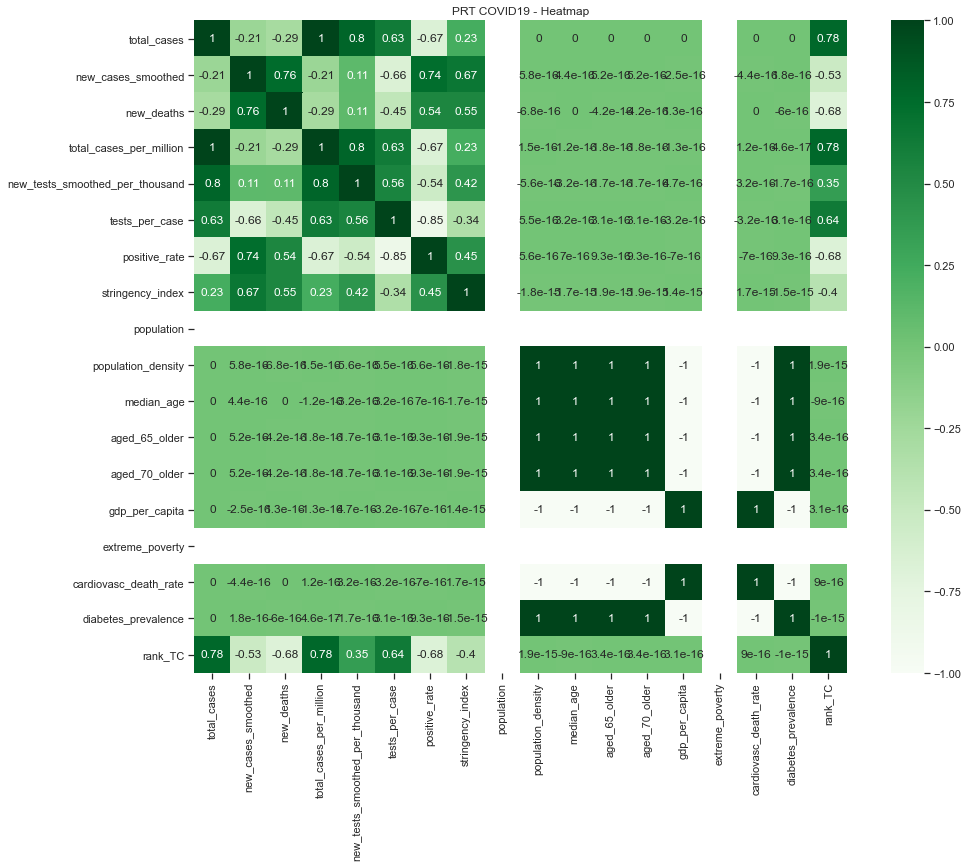

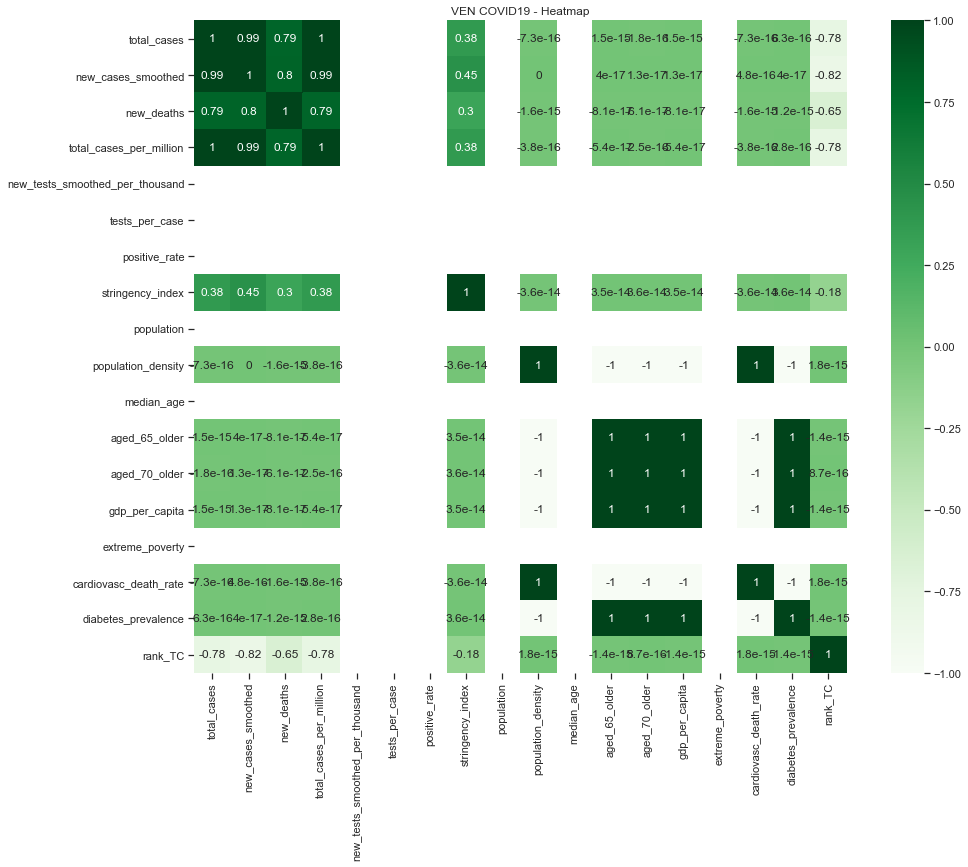

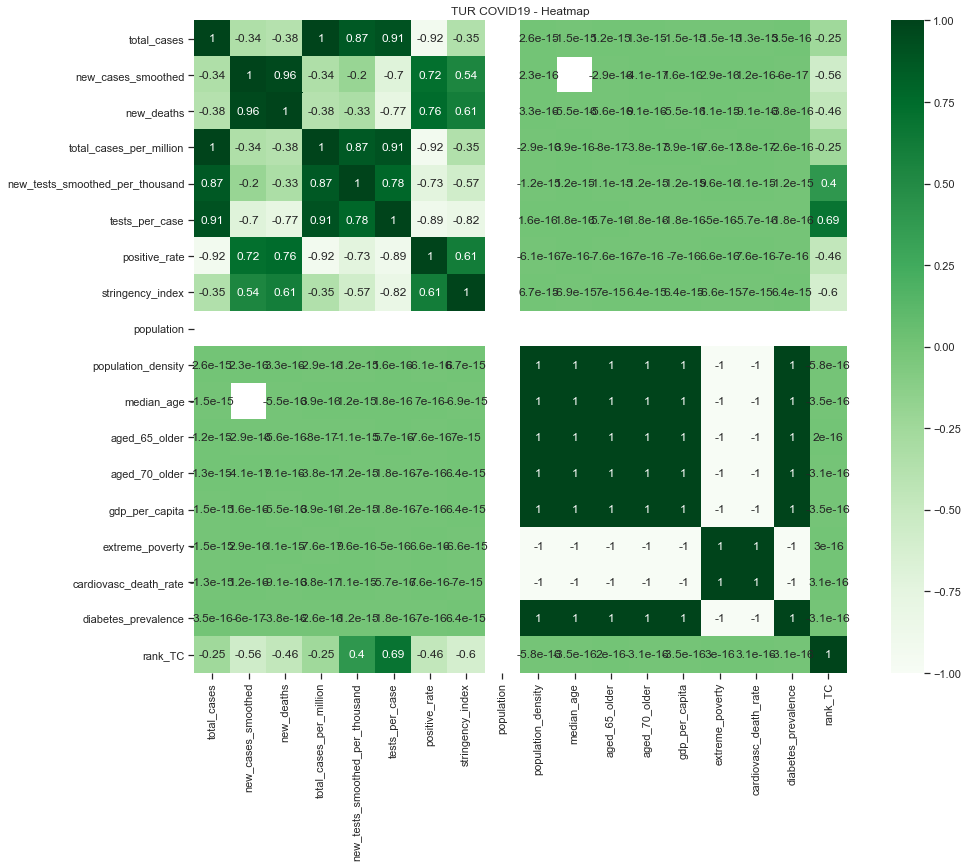

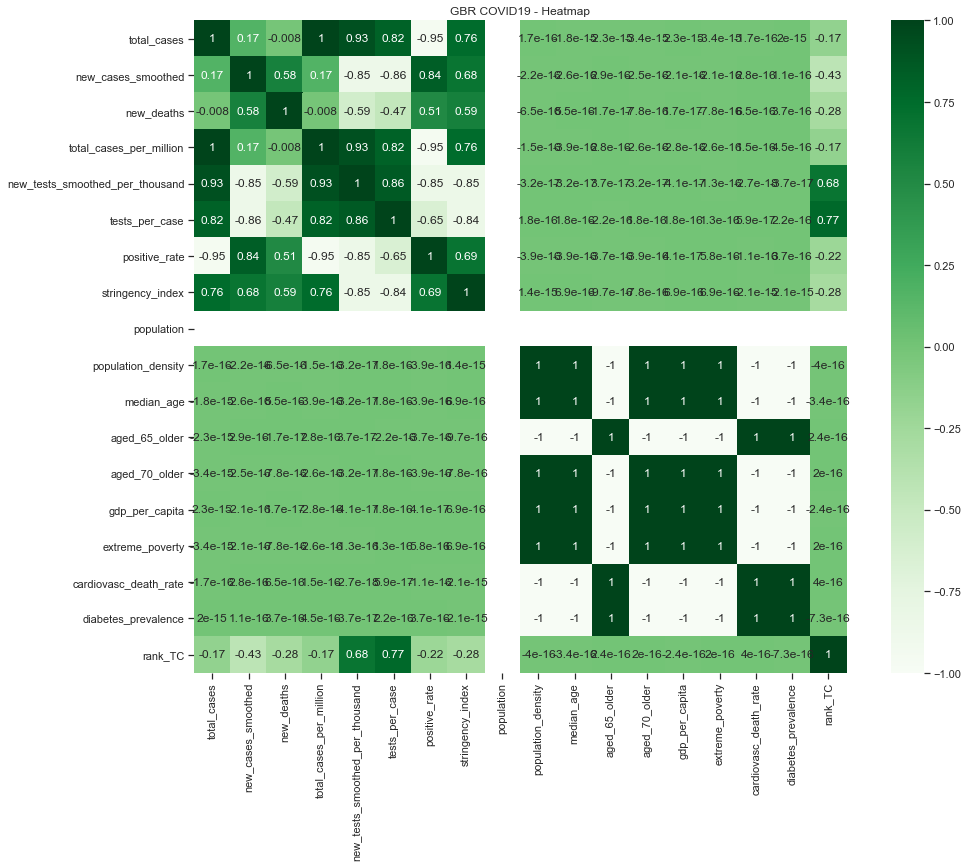

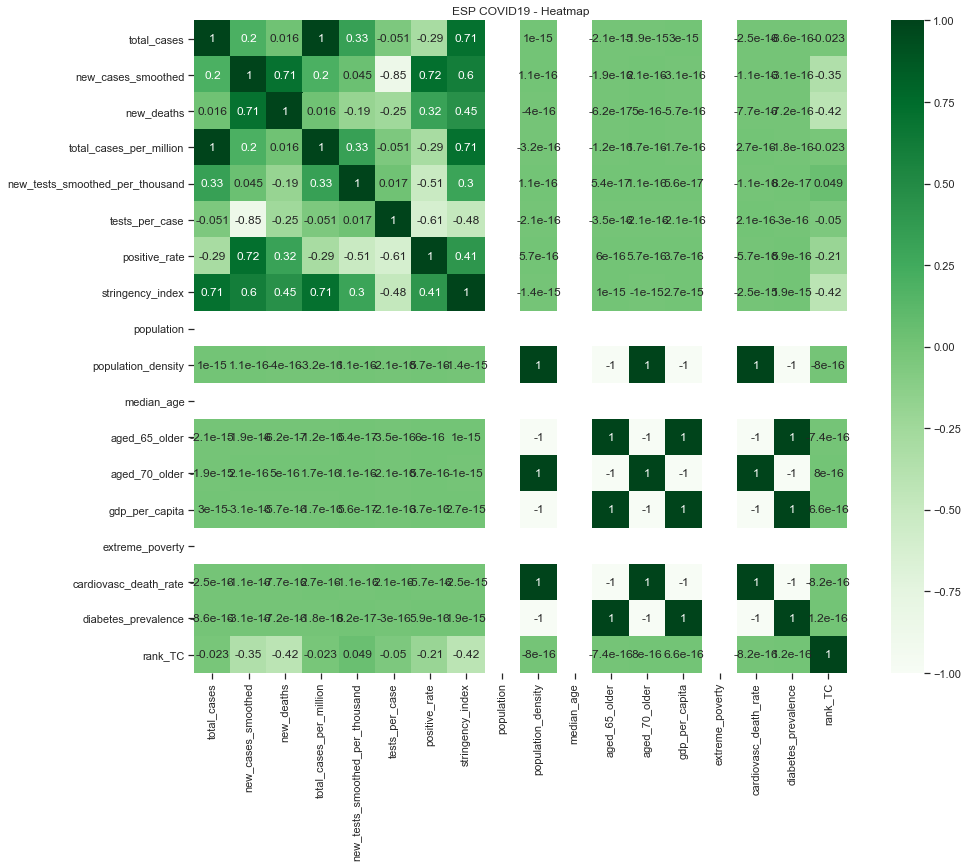

In [58]:
for elem in paises_grupoD:
    p_corr = covid_grupoD[covid_grupoD.iso_code==elem].iloc[:,np.r_[1,5,7,9,11,22:36,40]]
    vtb.graf_corr(p_corr, "Greens", elem) 